# Trophoblast trajectory analysis - trophoblasts; HVGs + mito genes

subsetting the data by HVGs produce the best representation of pseudotime/latent time/the differentiation trajectory of trophoblasts, and therefore will be used to assess the influence and trajectory of mitochondrial genes

In [1]:
import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np
import scvelo as scv
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
adata = ad.read_h5ad('./vt_22.04_annotated.h5ad')

In [3]:
adata

AnnData object with n_obs × n_vars = 13532 × 22999
    obs: 'Sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden', 'cell_type', 'unique_cell_type'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'Sample_colors', 'cell_type_colors', 'hvg', 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'pca', 'scrublet', 'umap', 'unique_cell_type_colors', 'wilcoxon'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'counts', 'matrix', 'spl

In [4]:
mitogenes = pd.read_csv("MitoCarta_genesonly.csv")["Symbol"].tolist()

In [5]:
# Create a boolean column in adata.var for mito_gene
adata.var["mito_gene"] = adata.var_names.str.split(".").str[0].isin(mitogenes)

In [6]:
trophoblasts = adata[adata.obs['cell_type'].isin(['CTB','STB','EVT'])].copy()

In [7]:
adata = trophoblasts

#### PAGA

In [8]:
sc.tl.paga(adata, groups="unique_cell_type")

<Axes: >

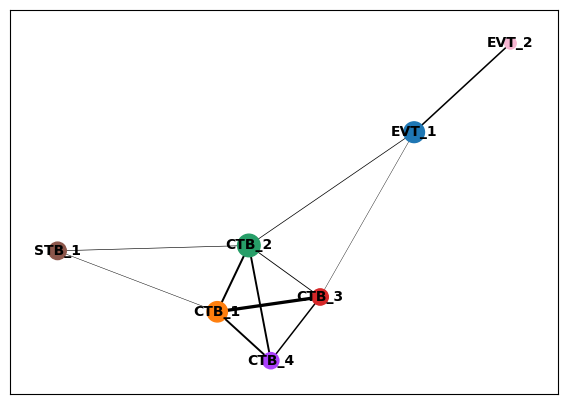

In [9]:
sc.pl.paga(adata, threshold=0.03, show=False)

In [10]:
sc.tl.draw_graph(adata, init_pos="paga")

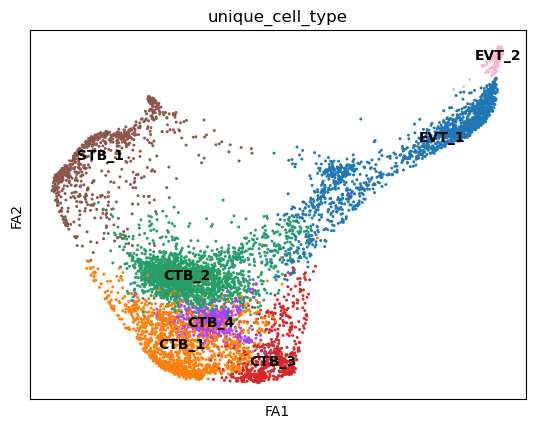

In [11]:
sc.pl.draw_graph(
    adata, color=["unique_cell_type"], legend_loc="on data"
)

#### Pseudotime

In [12]:
adata.uns["iroot"] = np.flatnonzero(adata.obs["unique_cell_type"] == "CTB_1")[0]

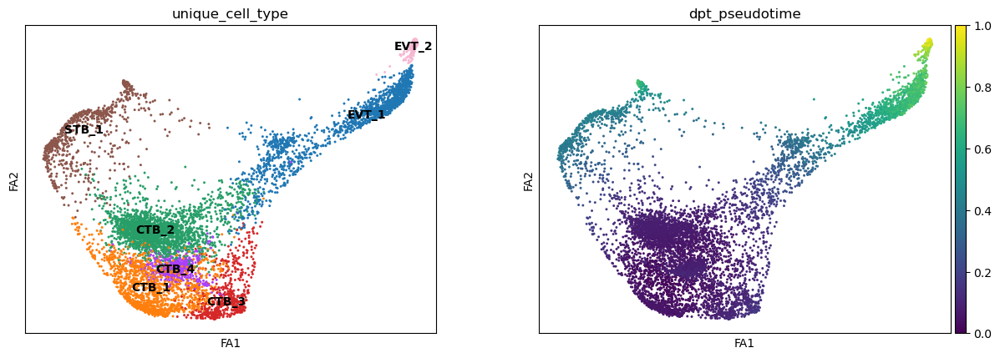

In [13]:
sc.tl.diffmap(adata)
sc.tl.dpt(adata)
sc.pl.draw_graph(adata, color=["unique_cell_type", "dpt_pseudotime"], legend_loc="on data")

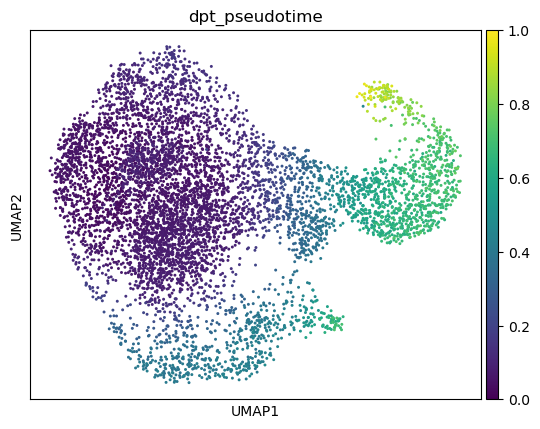

In [14]:
sc.pl.umap(adata, color='dpt_pseudotime', legend_loc='on data')
# 1 represents the most differentiated 

#### scVelo

In [15]:
scv.set_figure_params()

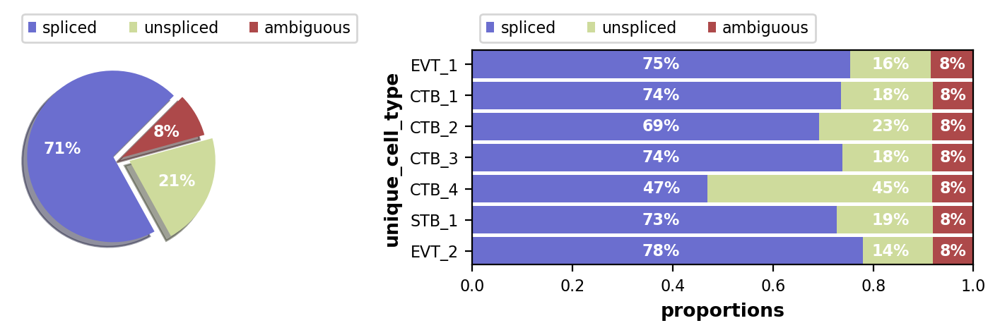

In [16]:
scv.pl.proportions(adata, groupby='unique_cell_type')

#### Filter data by HVGs and mito

Filtering by HVGs ensures accuracy for trajectory analysis; 
keeping all genes does not show clear results, resulting in trajectory arrows pointing in the reverse direction to what is biologically known;
mitochondrial genes retained for analysis

In [17]:
adata

AnnData object with n_obs × n_vars = 6593 × 22999
    obs: 'Sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden', 'cell_type', 'unique_cell_type', 'dpt_pseudotime'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mito_gene'
    uns: 'Sample_colors', 'cell_type_colors', 'hvg', 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'pca', 'scrublet', 'umap', 'unique_cell_type_colors', 'wilcoxon', 'unique_cell_type_sizes', 'draw_graph', 'iroot', 'diffmap_evals'
    obsm: 'X_p

In [18]:
mito_gene_list = adata.var_names[adata.var['mito_gene']].tolist()

In [19]:
scv.pp.filter_genes_dispersion(adata, retain_genes=mito_gene_list)

Extracted 3783 highly variable genes.


#### Assign mito pathways

In [20]:
mitocarta = pd.read_csv("./MitoCarta_full_transformed.csv")

In [21]:
# Create a dictionary where each gene maps to a list of pathways
gene_to_pathway_dict = mitocarta.groupby('Gene')['MitoPathway'].apply(list).to_dict()

In [22]:
# Add pathway information to the var metadata (now allows multiple pathways per gene)
adata.var['MitoPathways'] = adata.var_names.map(lambda x: gene_to_pathway_dict.get(x.split('.')[0], []))
# Check the result
adata.var[['MitoPathways']].head()

,MitoPathways
Gene,
ACAP3,[]
DVL1,[]
MXRA8,[]
AURKAIP1,"[Mitochondrial_central_dogma, Translation, Mit..."
CCNL2,[]


In [23]:
# 1. Define pathway names (matching the labels in MitoPathways)
pathway_names = ["OXPHOS", "OXPHOS_subunits", "OXPHOS_assembly_factors", "Complex_I", "CI_subunits", "CI_assembly_factors", 
                 "Complex_II", "CII_subunits", "CII_assembly_factors",
                 "Complex_III", "CIII_subunits", "CIII_assembly_factors",
                 "Complex_IV", "CIV_subunits", "CIV_assembly_factors",
                 "Complex_V", "CV_subunits", "CV_assembly_factors",
                 "Respirasome_assembly", "Cytochrome_C"]

In [24]:
# 2. Extract genes for each pathway
## create a dictionary where each key is a pathway name and each value is a list of genes associated with that pathway 
## finds genes in adata with the 'MitoPathways' annotation
pathway_genes = {}
for pathway in pathway_names:
    pathway_genes[pathway] = adata.var[adata.var['MitoPathways'].apply(lambda x: pathway in x)].index.tolist()
    print(f"Found {len(pathway_genes[pathway])} genes for {pathway}")

Found 156 genes for OXPHOS
Found 89 genes for OXPHOS_subunits
Found 68 genes for OXPHOS_assembly_factors
Found 59 genes for Complex_I
Found 37 genes for CI_subunits
Found 22 genes for CI_assembly_factors
Found 8 genes for Complex_II
Found 4 genes for CII_subunits
Found 4 genes for CII_assembly_factors
Found 15 genes for Complex_III
Found 9 genes for CIII_subunits
Found 6 genes for CIII_assembly_factors
Found 48 genes for Complex_IV
Found 18 genes for CIV_subunits
Found 30 genes for CIV_assembly_factors
Found 24 genes for Complex_V
Found 19 genes for CV_subunits
Found 5 genes for CV_assembly_factors
Found 4 genes for Respirasome_assembly
Found 2 genes for Cytochrome_C


#### RNA velocity

In [25]:
adata

AnnData object with n_obs × n_vars = 6593 × 3783
    obs: 'Sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden', 'cell_type', 'unique_cell_type', 'dpt_pseudotime', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mito_gene', 'MitoPathways'
    uns: 'Sample_colors', 'cell_type_colors', 'hvg', 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'pca', 'scrublet', 'umap', 'unique_cell_type_colors', 'wilcoxon'

In [26]:
scv.pp.moments(adata, use_rep='X_pca_harmony',n_pcs=30, n_neighbors=30, use_highly_variable=False)

Normalized count data: spliced, unspliced.
computing neighbors


/tmp/ipykernel_68705/451622553.py:1: DeprecationWarning: Automatic neighbor calculation is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors first with Scanpy.
  scv.pp.moments(adata, use_rep='X_pca_harmony',n_pcs=30, n_neighbors=30, use_highly_variable=False)
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/preprocessing/moments.py:71: DeprecationWarning: `neighbors` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors with Scanpy.
  neighbors(


    finished (0:00:02) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [27]:
scv.tl.velocity(adata, mode='stochastic',use_highly_variable=False)

computing velocities


/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/tools/optimization.py:184: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  gamma[i] = np.linalg.pinv(A.T.dot(A)).dot(A.T.dot(y[:, i]))


    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [28]:
scv.tl.velocity_graph(adata)

computing velocity graph (using 1/28 cores)


  0%|          | 0/6593 [00:00<?, ?cells/s]

    finished (0:00:12) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


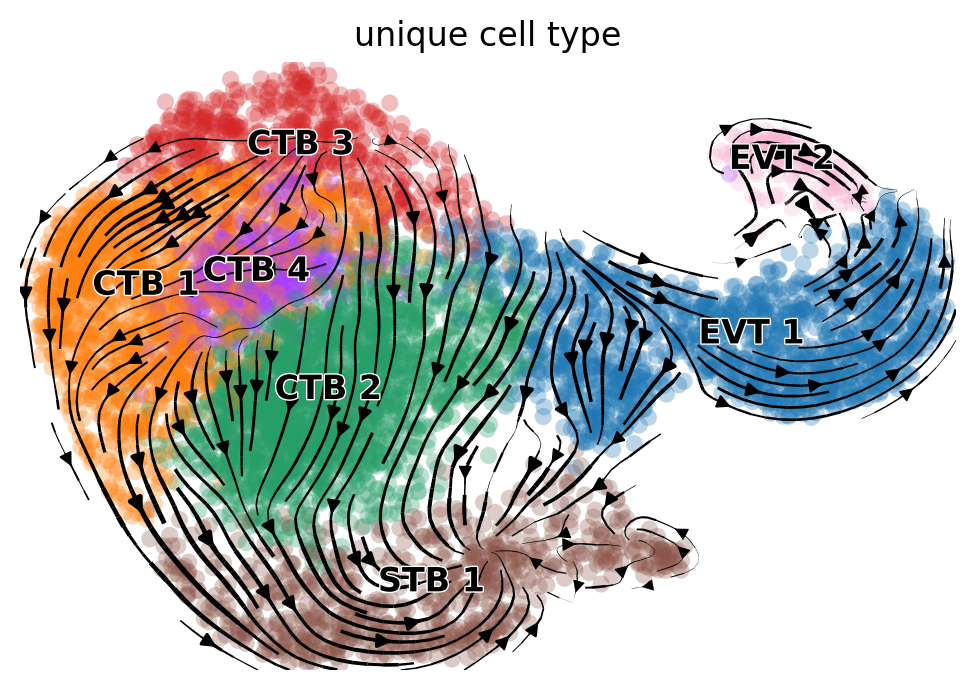

In [29]:
scv.pl.velocity_embedding_stream(adata, basis='umap',color='unique_cell_type')

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


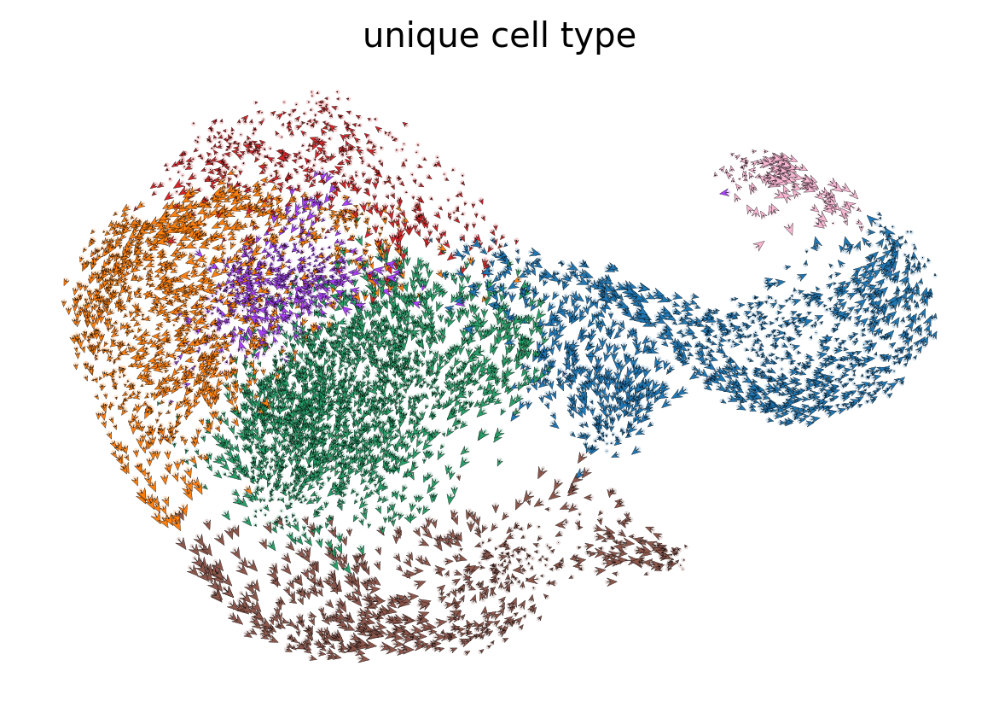

In [30]:
scv.pl.velocity_embedding(adata, arrow_length=3, arrow_size=2, dpi=120, color='unique_cell_type')

#### Speed and coherence

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


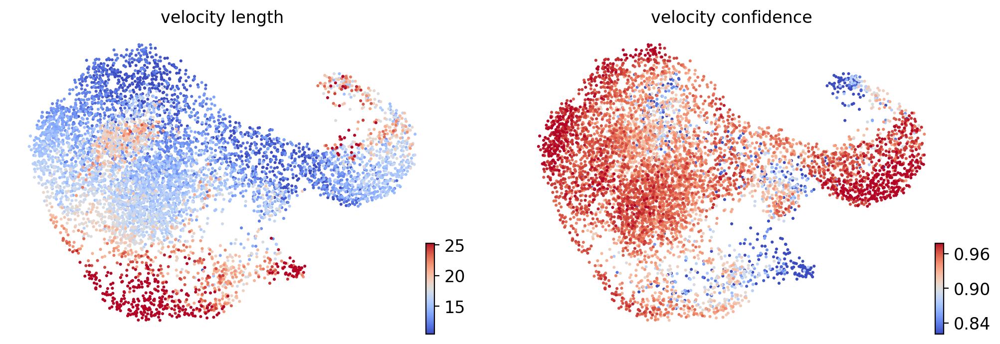

In [31]:
scv.tl.velocity_confidence(adata)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata, c=keys, cmap='coolwarm', perc=[5, 95])

In [32]:
df = adata.obs.groupby('unique_cell_type')[list(keys)].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

unique_cell_type,EVT_1,CTB_1,CTB_2,CTB_3,CTB_4,STB_1,EVT_2
velocity_length,14.169694,14.491128,15.542286,11.131231,17.927931,25.492605,19.515263
velocity_confidence,0.935714,0.952705,0.943319,0.942048,0.920243,0.867758,0.827300


#### Velocity graph and pseudotime

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


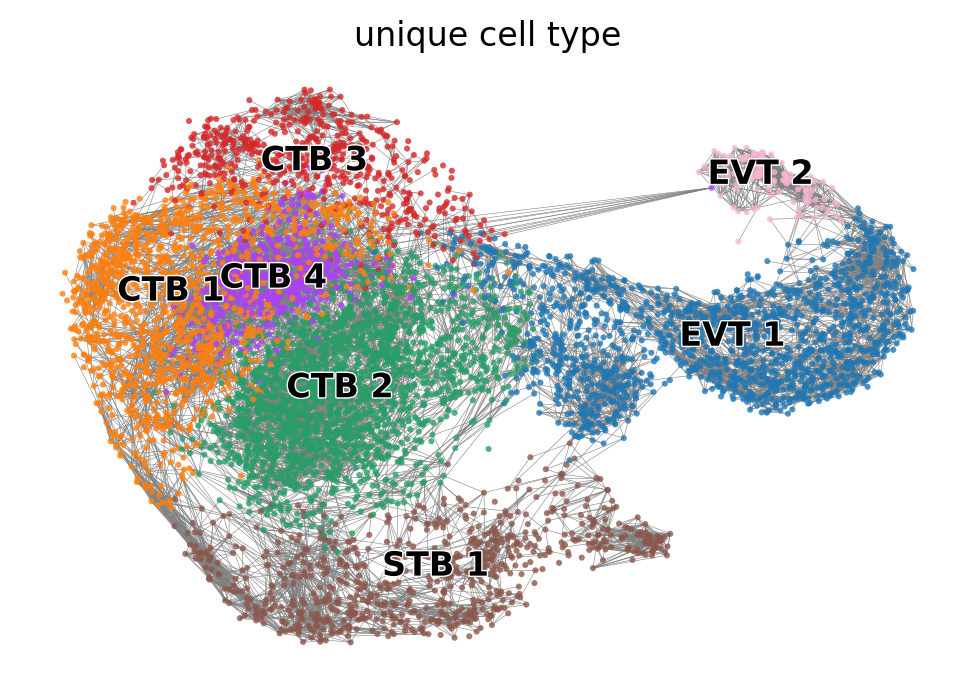

In [33]:
scv.pl.velocity_graph(adata, threshold=.1, color='unique_cell_type', legend_loc='on data')

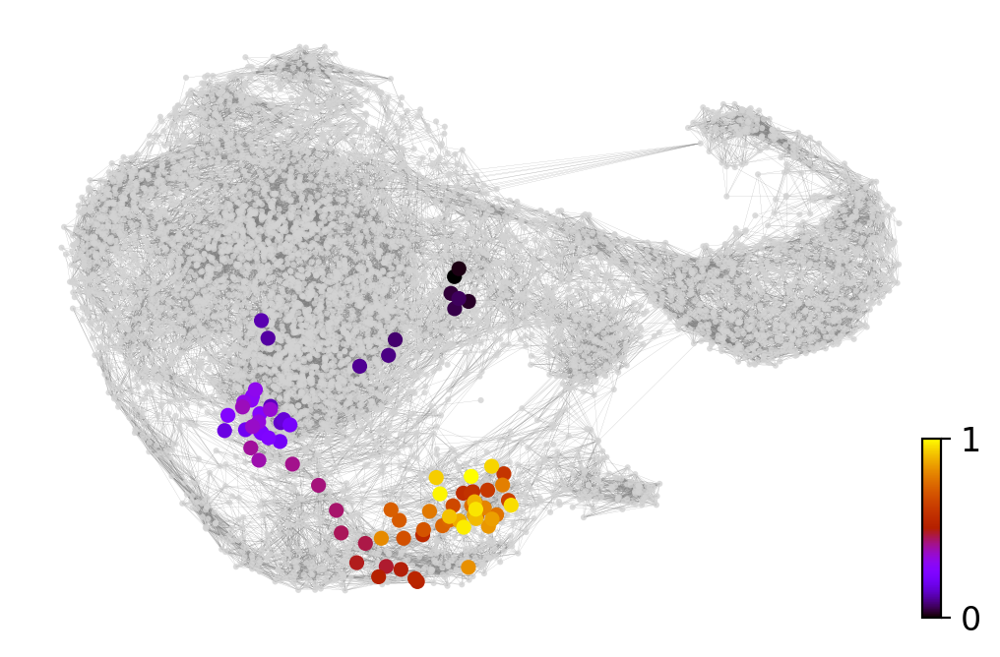

In [34]:
x, y = scv.utils.get_cell_transitions(adata, basis='umap', starting_cell=70)
ax = scv.pl.velocity_graph(adata, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

computing terminal states
    identified 4 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


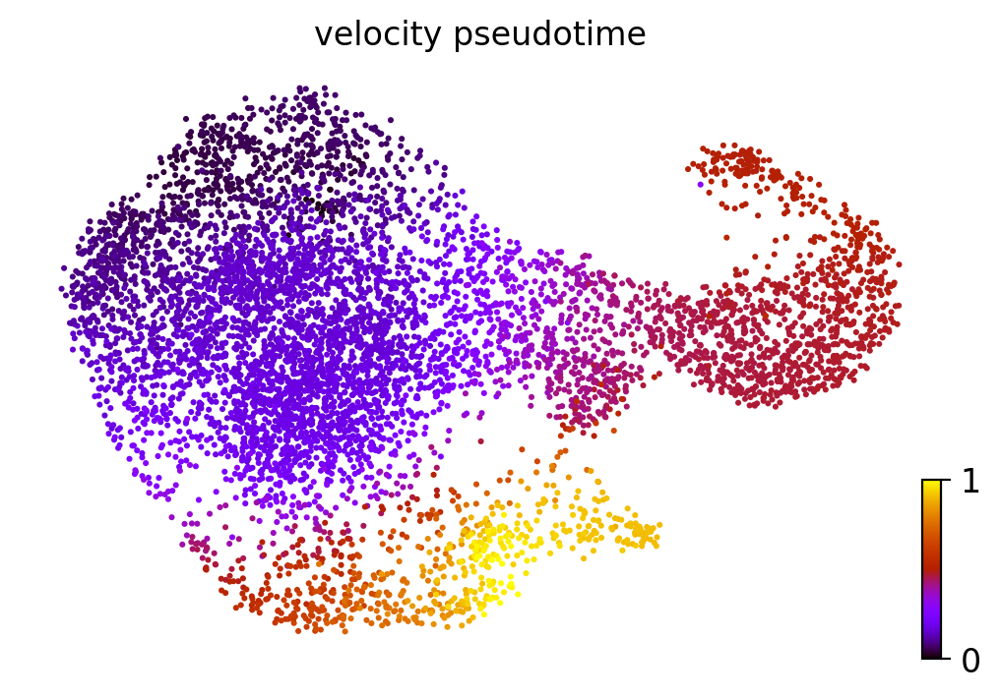

In [35]:
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')

#### (PAGA velocity graph)

In [36]:
# scv.tl.paga(adata, groups='unique_cell_type')
# df = scv.get_df(adata, 'paga/transitions_confidence', precision=2).T
# df.style.background_gradient(cmap='Blues').format('{:.2g}')

#### Dynamic model:

In [37]:
scv.tl.recover_dynamics(adata)

recovering dynamics (using 1/28 cores)


  0%|          | 0/619 [00:00<?, ?gene/s]

    finished (0:05:21) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [38]:
scv.tl.velocity(adata, mode='dynamical',use_highly_variable=False)
scv.tl.velocity_graph(adata)

computing velocities
    finished (0:00:03) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/28 cores)


  0%|          | 0/6593 [00:00<?, ?cells/s]

    finished (0:00:09) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


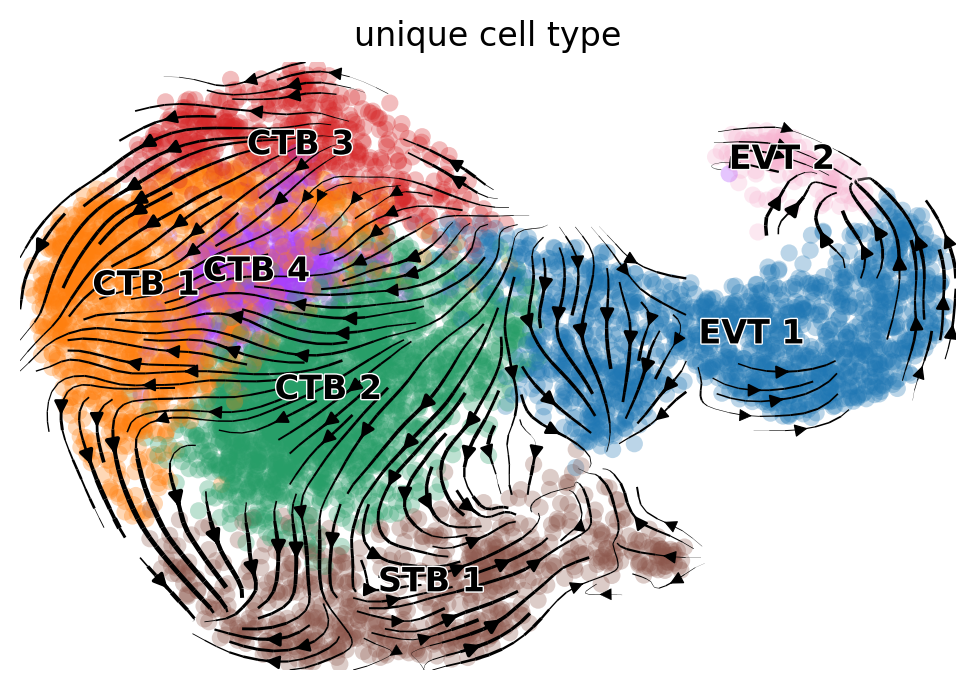

In [39]:
scv.pl.velocity_embedding_stream(adata, basis='umap',color='unique_cell_type')

#### Kinetic rate paramters:

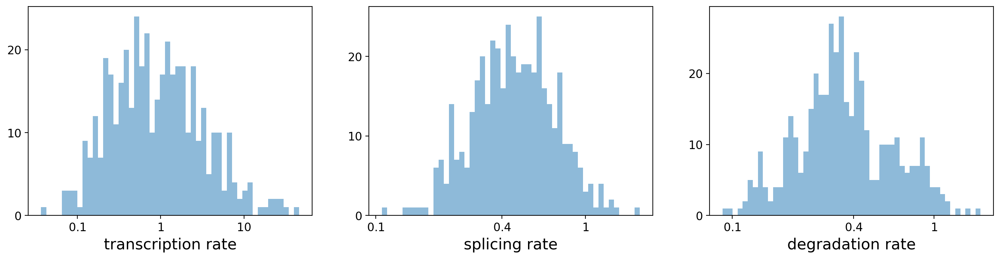

/tmp/ipykernel_68705/3438405563.py:10: DeprecationWarning: `get_df` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please `AnnData::get_df` or Scanpy's `scanpy.get.obs_df` or `scanpy.get.var_df`.
  scv.get_df(adata, 'fit*', dropna=True).head()


,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,fit_r2
Gene,,,,,,,,,,,,,,,,
NPPB,1.640728,10.658084,0.186601,11.420063,0.021114,0.040829,1.861229,0.000004,0.0,0.0,0.495267,0.131578,5.291363,1.260902,4.073421,0.617964
HSPG2,4.771438,4.305192,0.805478,7.074388,0.099515,0.170907,0.811473,0.060247,0.0,0.0,0.498583,0.993438,4.551039,2.210932,1.102861,0.816602
E2F2,0.413794,8.351212,0.323414,2.569756,0.182366,0.013325,0.100649,0.000761,0.0,0.0,0.464837,0.041493,0.369903,1.809080,1.008416,0.100579
AL031280.1,0.150806,0.310740,0.352325,7.088143,1.984326,0.147170,0.111125,0.230287,0.0,0.0,0.384238,0.397770,0.293227,0.808906,2.186959,0.538821
CRYBG2,0.246218,0.854499,0.276320,8.940995,0.528810,0.075706,0.192912,0.200877,0.0,0.0,0.463109,0.252167,0.604525,1.097946,2.683860,0.327458


In [40]:
df = adata.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata, 'fit*', dropna=True).head()

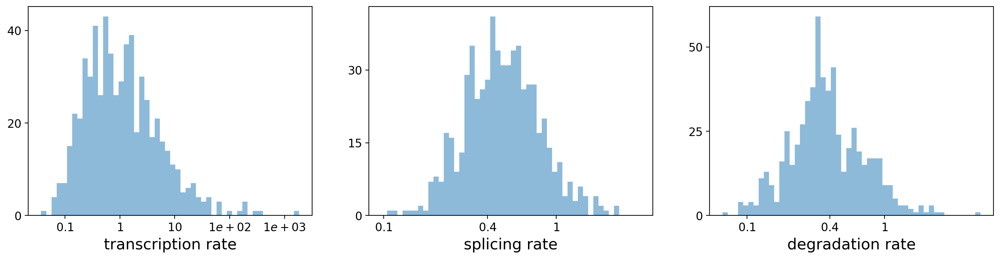

/tmp/ipykernel_68705/3086570055.py:9: DeprecationWarning: `get_df` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please `AnnData::get_df` or Scanpy's `scanpy.get.obs_df` or `scanpy.get.var_df`.
  scv.get_df(adata, 'fit*', dropna=True).head()


,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,fit_r2
Gene,,,,,,,,,,,,,,,,
NPPB,1.640728,10.658084,0.186601,11.420063,0.021114,0.040829,1.861229,0.000004,0.0,0.0,0.495267,0.131578,5.291363,1.260902,4.073421,0.617964
HSPG2,4.771438,4.305192,0.805478,7.074388,0.099515,0.170907,0.811473,0.060247,0.0,0.0,0.498583,0.993438,4.551039,2.210932,1.102861,0.816602
E2F2,0.413794,8.351212,0.323414,2.569756,0.182366,0.013325,0.100649,0.000761,0.0,0.0,0.464837,0.041493,0.369903,1.809080,1.008416,0.100579
AL031280.1,0.150806,0.310740,0.352325,7.088143,1.984326,0.147170,0.111125,0.230287,0.0,0.0,0.384238,0.397770,0.293227,0.808906,2.186959,0.538821
CRYBG2,0.246218,0.854499,0.276320,8.940995,0.528810,0.075706,0.192912,0.200877,0.0,0.0,0.463109,0.252167,0.604525,1.097946,2.683860,0.327458


In [41]:
df = adata.var # not filtered for velocity gene and likelihood thresholds 

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata, 'fit*', dropna=True).head()

#### Latent time:

computing latent time using root_cells as prior
    finished (0:00:01) --> added 
    'latent_time', shared time (adata.obs)


/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


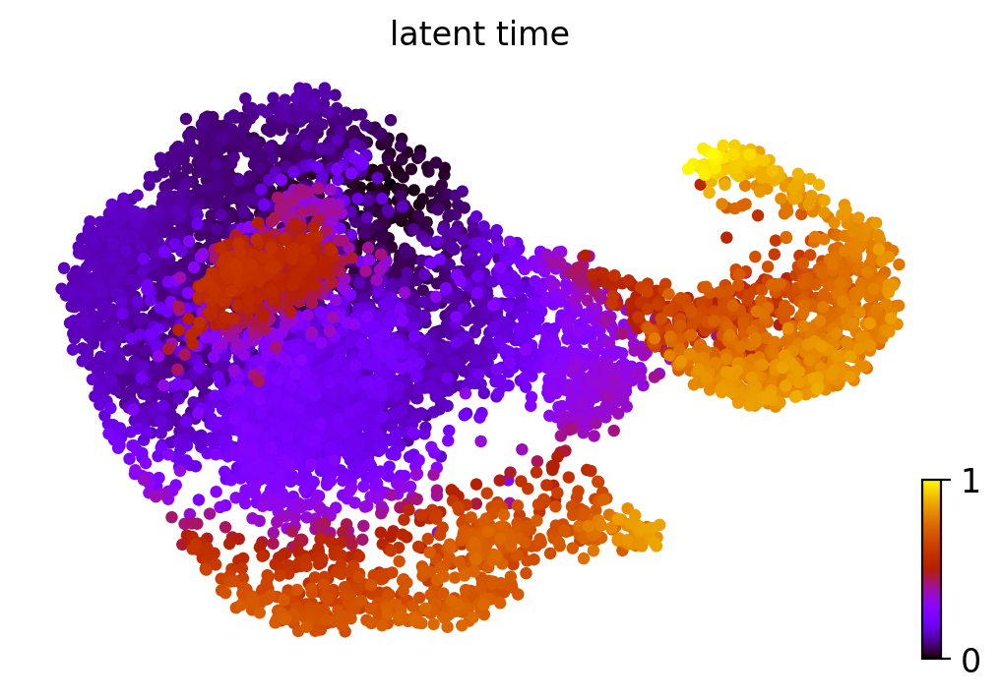

In [42]:
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80) 
# purple represents early stage of development; yellow represents differentiated cell 

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


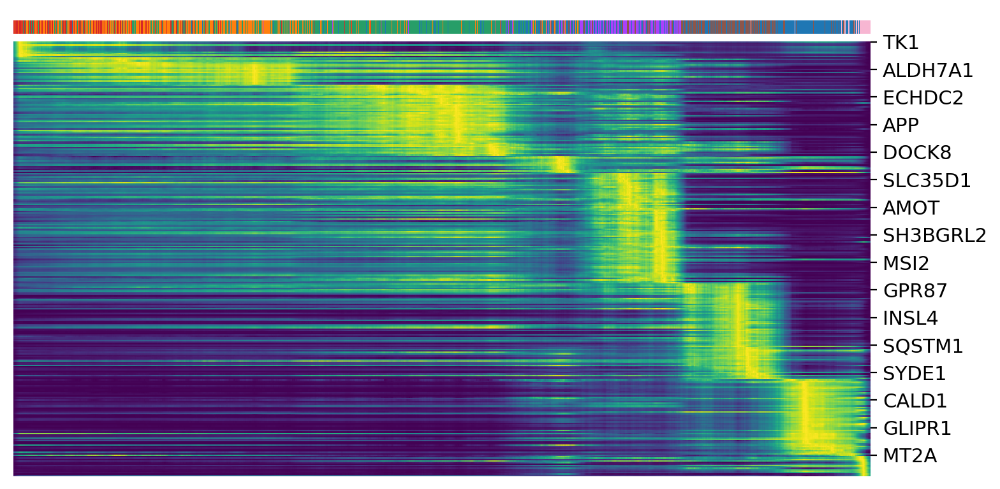

In [43]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata, var_names=top_genes, col_color='unique_cell_type', sortby='latent_time', n_convolve=100)

#### Velocity genes:

In [44]:
scv.tl.velocity_genes(adata)

Number of obtained velocity_genes: 619


In [45]:
adata.var[(adata.var['velocity_genes']) & (adata.var['mito_gene'])] # filtered for mito velocity genes

,mt,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,n_cells,highly_variable,means,...,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,fit_r2
Gene,,,,,,,,,,,,,,,,,,,,,
ECHDC2,False,4967,0.553285,0.440372,70.411628,9288.0,9.136586,4892,True,0.398752,...,0.740439,4.168914e-01,0.0,0.0,0.416002,0.725415,1.591646,0.322752,1.122687,0.676011
MPC2,False,7527,1.641627,0.971395,55.161732,27558.0,10.224085,7419,True,0.586269,...,1.626006,3.412025e-01,0.0,0.0,0.474987,0.184905,3.375479,0.412893,2.509447,0.307962
KMO,False,341,0.029308,0.028887,97.968666,492.0,6.200509,335,True,0.034175,...,0.326113,3.716180e-01,0.0,0.0,0.459454,5.596808,0.821264,0.230309,4.607451,0.929466
FTH1,False,13286,17.054626,2.893402,20.855424,286296.0,12.564785,12711,True,1.146026,...,7.447025,1.591695e-01,0.0,0.0,0.499835,0.650653,34.420375,1.845677,1.100676,0.520707
FDX1,False,5839,1.130696,0.756449,65.217132,18981.0,9.851247,5744,True,0.514352,...,2.620877,1.793020e-01,0.0,0.0,0.498683,0.527594,10.287489,1.335238,1.335622,0.406835
LDHB,False,11490,7.438137,2.132761,31.554179,124864.0,11.734988,11077,True,1.045206,...,5.717724,2.804372e-01,0.0,0.0,0.495395,0.180682,13.754125,0.471811,1.115065,0.337288
IFI27,False,1867,0.964735,0.675357,88.878299,16195.0,9.692519,1829,True,0.073340,...,2.854599,8.469199e-07,0.0,0.0,0.498825,0.308110,12.173760,0.622655,0.841188,0.717724
CYP11A1,False,4494,1.511765,0.920986,73.229285,25378.0,10.141678,4376,True,0.548249,...,3.721449,2.860651e-01,0.0,0.0,0.498903,1.632513,11.777263,0.508549,1.343332,0.878905
CKMT1B,False,2731,0.386966,0.327119,83.731459,6496.0,8.779096,2702,True,0.272165,...,0.615629,2.685778e-01,0.0,0.0,0.458158,0.094130,1.265764,0.623452,1.170206,0.254335


#### Top likelihood genes:

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-package

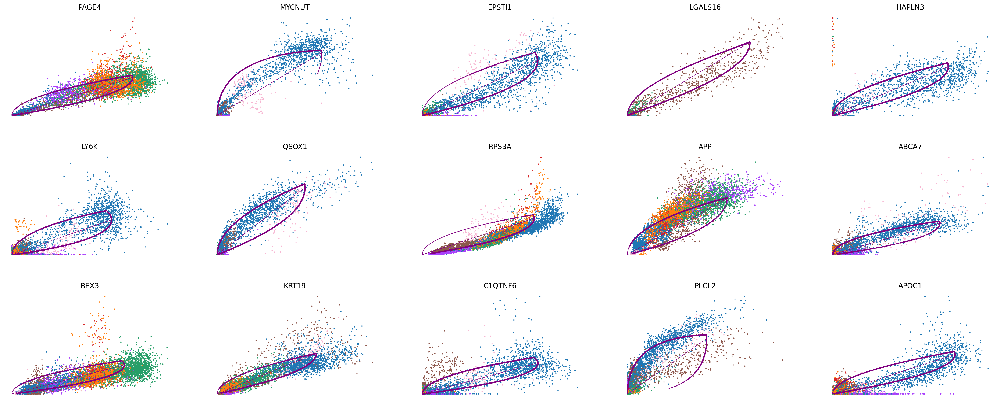

In [46]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata, basis=top_genes[:15], ncols=5, color='unique_cell_type', frameon=False)


/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-package

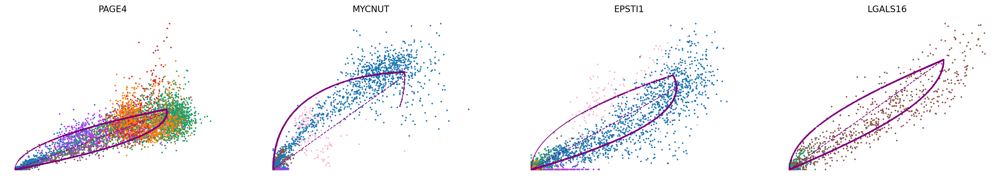

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-package

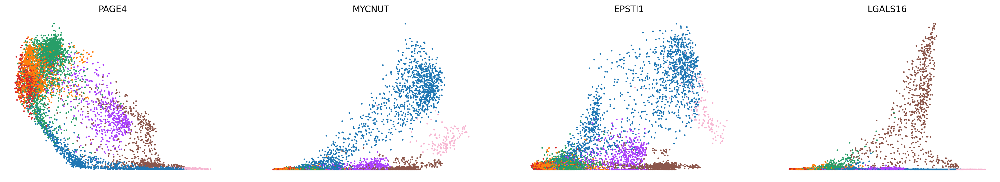

In [47]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata, top_genes[:4], color='unique_cell_type', frameon=False)
scv.pl.scatter(adata, x='latent_time', y=top_genes[:4], color='unique_cell_type', frameon=False)

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-package

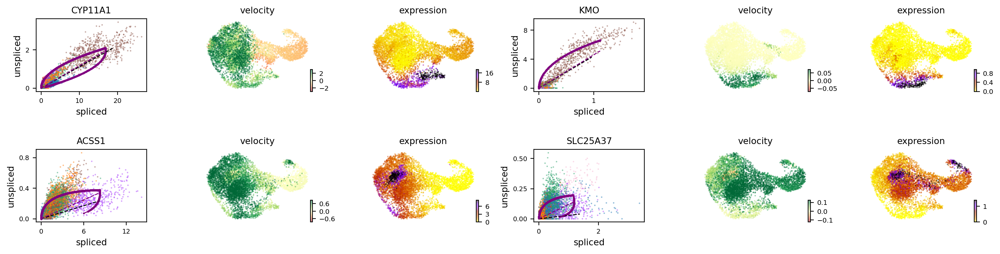

In [48]:
scv.pl.velocity(adata, ['CYP11A1',  'KMO', 'ACSS1', 'SLC25A37'], color='unique_cell_type', ncols=2)

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-package

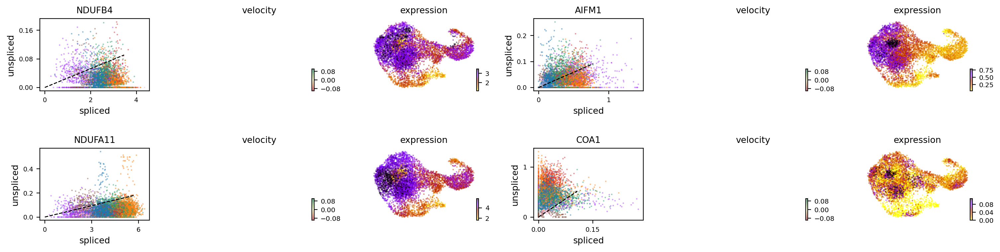

In [49]:
scv.pl.velocity(adata, ['NDUFB4',  'AIFM1', 'NDUFA11', 'COA1'], color='unique_cell_type', ncols=2)

In [49]:
adata

AnnData object with n_obs × n_vars = 6593 × 3783
    obs: 'Sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden', 'cell_type', 'unique_cell_type', 'dpt_pseudotime', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mito_gene', 'MitoPathways', 'veloci

In [50]:
adata.var['velocity_mito_genes'] = adata.var['velocity_genes'] & adata.var['mito_gene']
adata.var

,mt,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,n_cells,highly_variable,means,...,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,fit_r2,velocity_mito_genes
Gene,,,,,,,,,,,,,,,,,,,,,
ACAP3,False,887,0.057842,0.056231,94.716149,971.0,6.879356,840,True,0.040871,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.098854,False
DVL1,False,1164,0.077500,0.074644,93.066063,1301.0,7.171657,1136,True,0.063682,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000272,False
MXRA8,False,3566,0.703640,0.532767,78.757372,11812.0,9.376956,3504,True,0.151240,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.190609,False
AURKAIP1,False,10321,2.443617,1.236522,38.517901,41021.0,10.621863,10146,False,0.726770,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.026854,False
CCNL2,False,3204,0.233097,0.209529,80.913802,3913.0,8.272315,3107,True,0.169478,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.154158,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZFY,False,454,0.029011,0.028598,97.295526,487.0,6.190315,451,True,0.021487,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.900327,False
PCDH11Y,False,216,0.013225,0.013138,98.713290,222.0,5.407172,206,True,0.016956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.281811,False
PRKY,False,383,0.024722,0.024421,97.718473,415.0,6.030685,375,True,0.018528,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.200116,False


In [51]:
print(adata.var.index[adata.var['velocity_mito_genes']].tolist()) # 27 genes

['ECHDC2', 'MPC2', 'KMO', 'FTH1', 'FDX1', 'LDHB', 'IFI27', 'CYP11A1', 'CKMT1B', 'C15orf48', 'GPT2', 'BCL2', 'PMAIP1', 'EFHD1', 'ACSS1', 'CHCHD6', 'ALDH7A1', 'ECI2', 'PDK4', 'CROT', 'AGPAT5', 'SLC25A37', 'ADHFE1', 'AK3', 'STOM', 'MAOA']


#### Plot mito genes on heatmap

In [52]:
# define OXPHOS genes
oxphos_genes = pathway_genes["OXPHOS"]

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


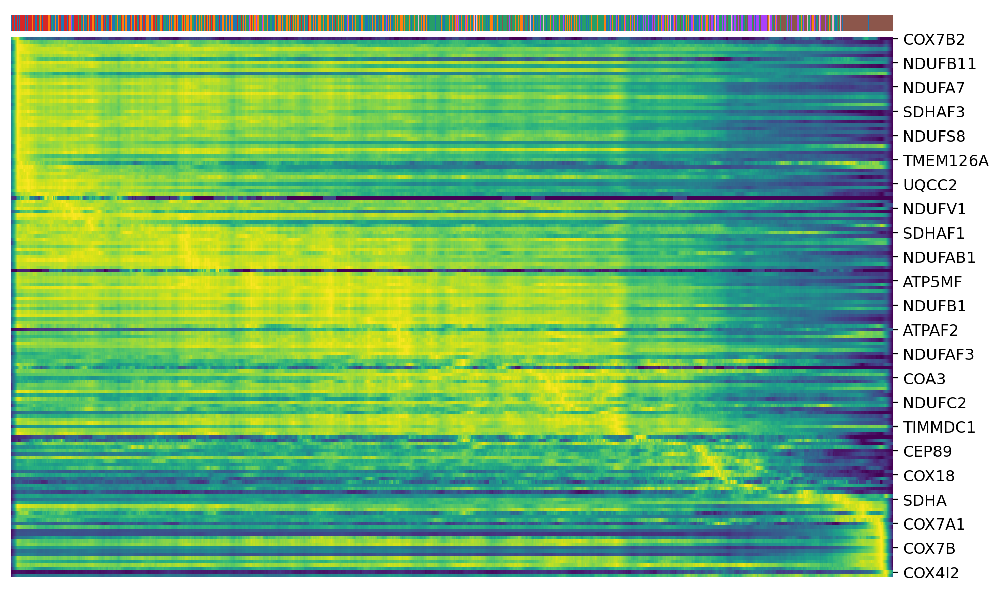

In [53]:
# Plot heatmap: expression trends of OXPHOS genes sorted by velocity length
scv.pl.heatmap(
    adata,
    var_names=oxphos_genes,
    sortby='velocity_length',
    col_color='unique_cell_type',  # or any other obs annotation you'd like
    n_convolve=100,        # smooths the heatmap (adjust as needed)
    cmap='coolwarm',       # or 'viridis', 'RdBu_r' etc.
    figsize=(10, 6),
)

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


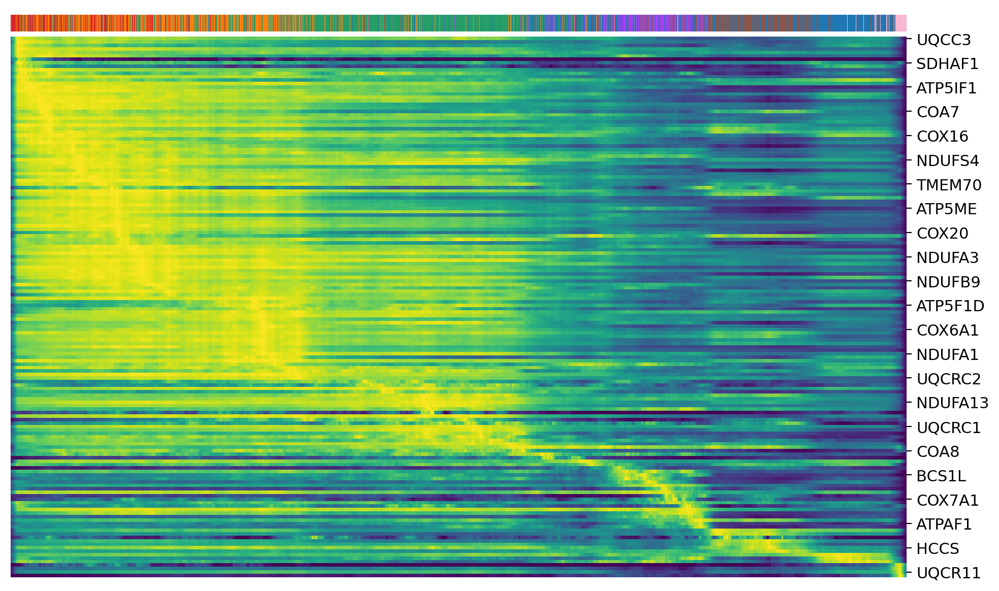

In [54]:
# Plot heatmap: expression trends of OXPHOS genes sorted by latent time
scv.pl.heatmap(
    adata,
    var_names=oxphos_genes,
    sortby='latent_time',
    col_color='unique_cell_type',  # or any other obs annotation you'd like
    n_convolve=100,        # smooths the heatmap (adjust as needed)
    cmap='coolwarm',       # or 'viridis', 'RdBu_r' etc.
    figsize=(10, 6),
)

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


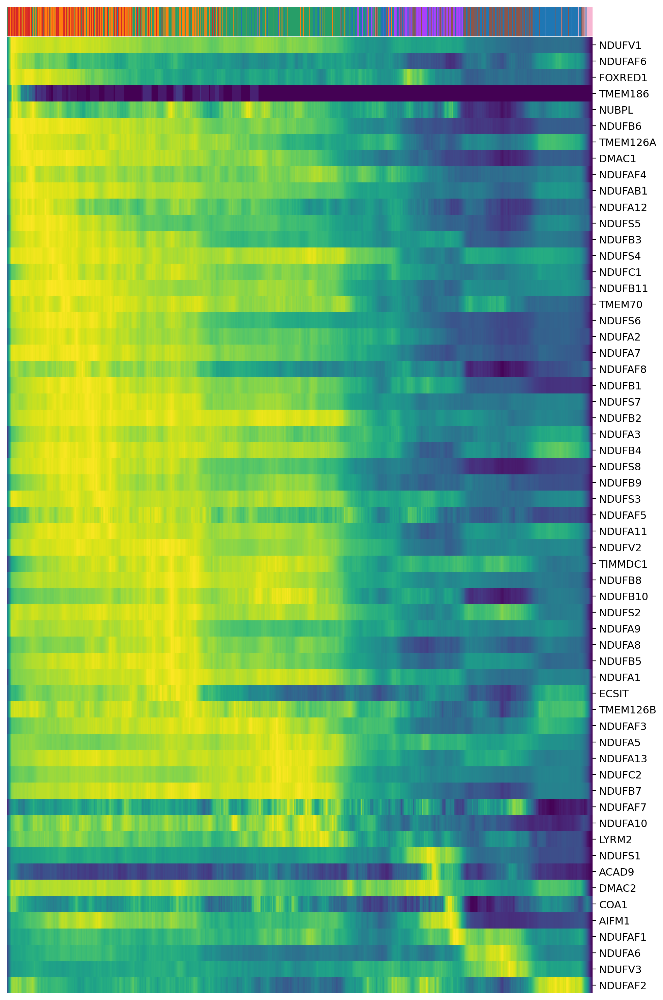

In [55]:
# Grab the CI genes
CI_genes = pathway_genes["Complex_I"]
# Plot heatmap: expression trends of CI genes sorted by latent time
scv.pl.heatmap(
    adata,
    var_names=CI_genes,
    sortby='latent_time',
    col_color='unique_cell_type',  # or any other obs annotation you'd like
    n_convolve=100,        # smooths the heatmap (adjust as needed)
    cmap='coolwarm',       # or 'viridis', 'RdBu_r' etc.
    figsize=(10, 15),
)

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


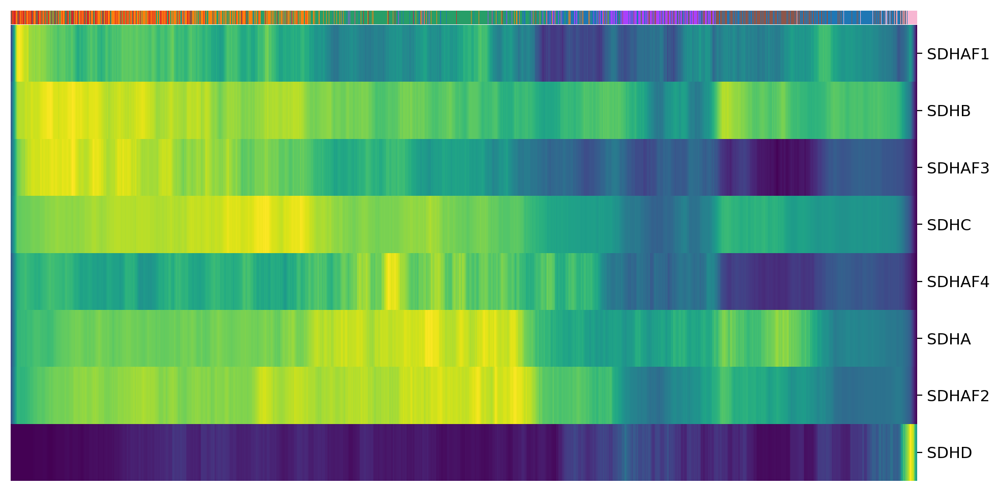

In [56]:
# Grab the CII genes
CII_genes = pathway_genes["Complex_II"]
# Plot heatmap: expression trends of CII genes sorted by latent time
scv.pl.heatmap(
    adata,
    var_names=CII_genes,
    sortby='latent_time',
    col_color='unique_cell_type',  # or any other obs annotation you'd like
    n_convolve=100,        # smooths the heatmap (adjust as needed)
    cmap='coolwarm',       # or 'viridis', 'RdBu_r' etc.
    figsize=(10, 5),
)

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


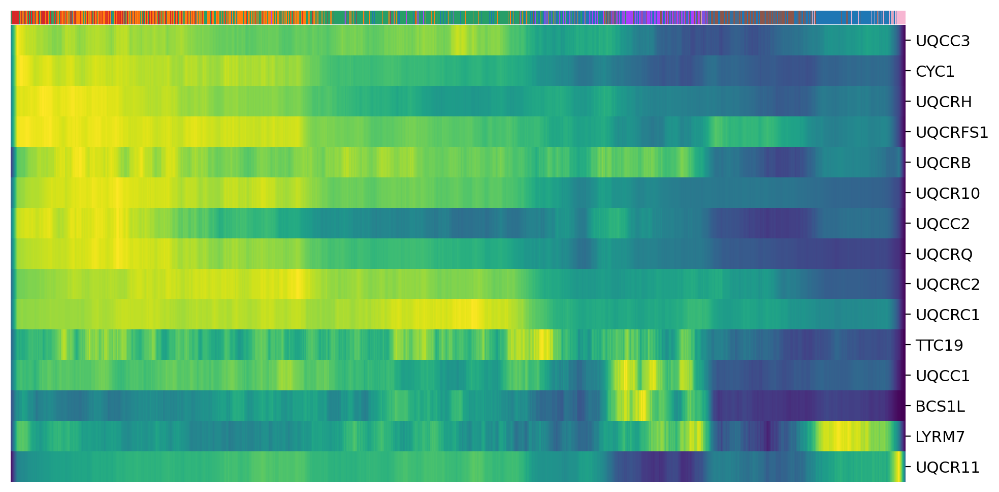

In [57]:
# Grab the CIII genes
CIII_genes = pathway_genes["Complex_III"]
# Plot heatmap: expression trends of CIII genes sorted by latent time
scv.pl.heatmap(
    adata,
    var_names=CIII_genes,
    sortby='latent_time',
    col_color='unique_cell_type',  # or any other obs annotation you'd like
    n_convolve=100,        # smooths the heatmap (adjust as needed)
    cmap='coolwarm',       # or 'viridis', 'RdBu_r' etc.
    figsize=(10, 5),
)

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


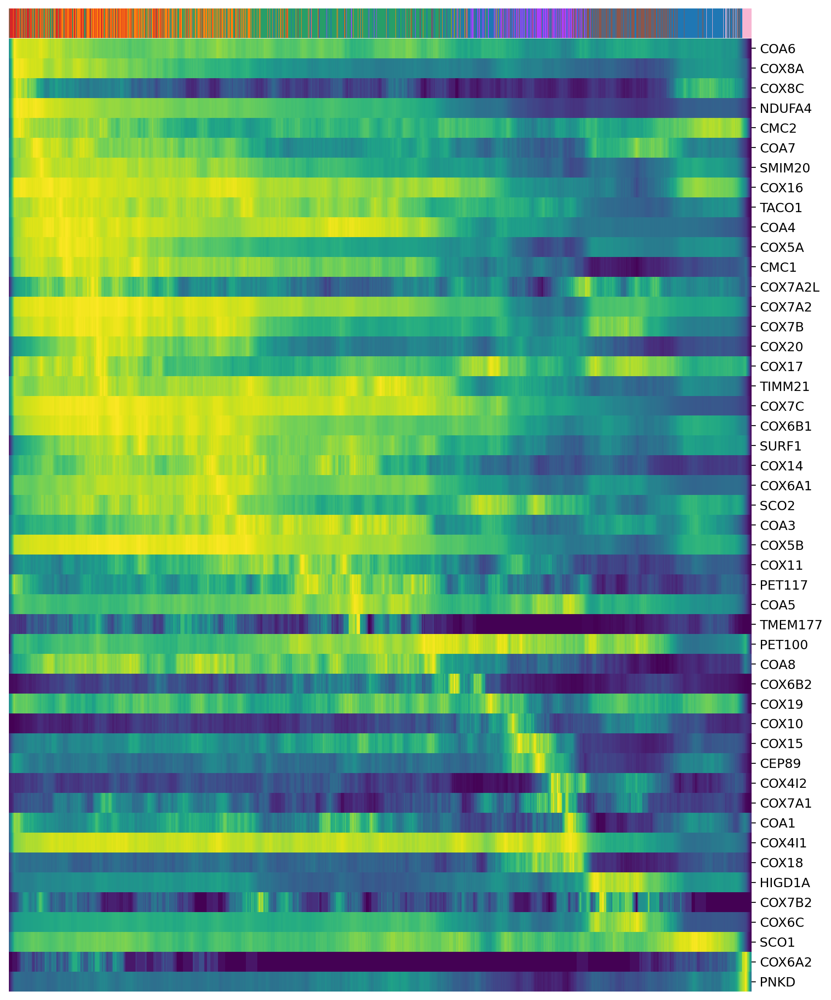

In [58]:
# Grab the CIV genes
CIV_genes = pathway_genes["Complex_IV"]
# Plot heatmap: expression trends of CIV genes sorted by latent time
scv.pl.heatmap(
    adata,
    var_names=CIV_genes,
    sortby='latent_time',
    col_color='unique_cell_type',  # or any other obs annotation you'd like
    n_convolve=100,        # smooths the heatmap (adjust as needed)
    cmap='coolwarm',       # or 'viridis', 'RdBu_r' etc.
    figsize=(10, 12),
)

/home/shannon/miniconda3/envs/RP1/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


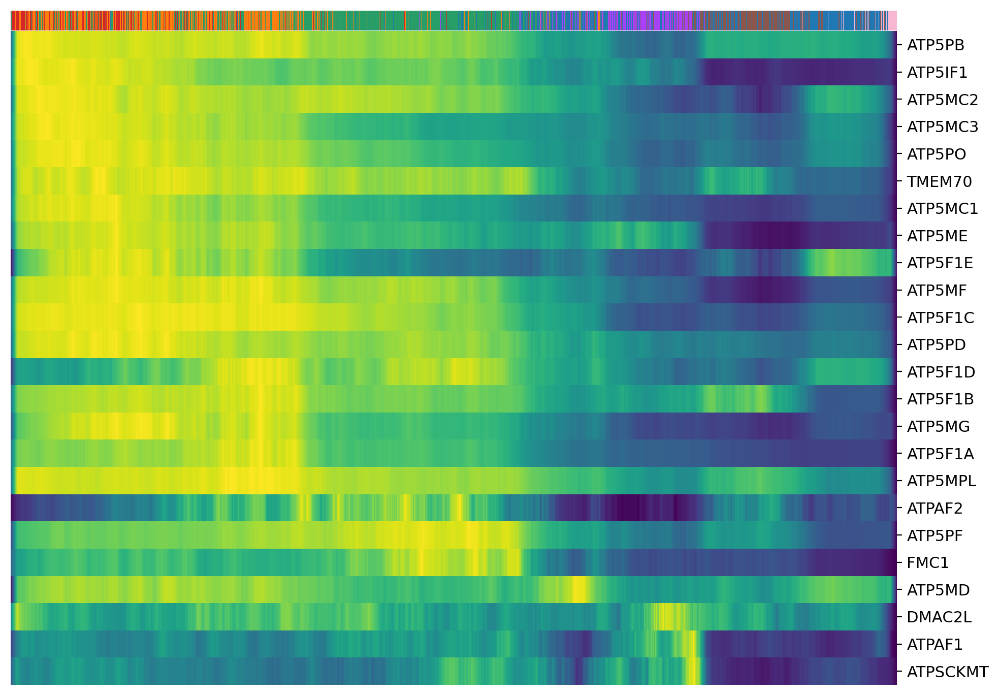

In [59]:
# Grab the CV genes
CV_genes = pathway_genes["Complex_V"]
# Plot heatmap: expression trends of CV genes sorted by latent time
scv.pl.heatmap(
    adata,
    var_names=CV_genes,
    sortby='latent_time',
    col_color='unique_cell_type',  # or any other obs annotation you'd like
    n_convolve=100,        # smooths the heatmap (adjust as needed)
    cmap='coolwarm',       # or 'viridis', 'RdBu_r' etc.
    figsize=(10, 7),
)

In [60]:
adata.obs.to_csv("vt.traj_obs.csv")
adata.var.to_csv("vt.traj_var.csv")
adata.to_df().to_csv("vt.traj_X.csv")